In [ ]:
#https://drive.google.com/file/d/1hw6S7wAs3hbbV3qTSbNYJAHsw56_FEcg/view?usp=sharing
!gdown --id 1hw6S7wAs3hbbV3qTSbNYJAHsw56_FEcg

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1hw6S7wAs3hbbV3qTSbNYJAHsw56_FEcg
To: /content/Banking.csv
100% 15.7M/15.7M [00:00<00:00, 118MB/s]


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import random
import numpy as np
import warnings
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from scipy import stats
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler,MinMaxScaler
from sklearn.preprocessing import FunctionTransformer, power_transform,PowerTransformer
from collections import Counter
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, accuracy_score
from catboost import CatBoostClassifier,CatBoostRegressor
from imblearn.pipeline import make_pipeline as make_imb_pipeline
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from sklearn.neural_network import MLPClassifier
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
warnings.filterwarnings("ignore")

'\nfrom sklearn.model_selection import train_test_split\nfrom sklearn.preprocessing import RobustScaler,MinMaxScaler\nfrom sklearn.preprocessing import FunctionTransformer, power_transform,PowerTransformer\nfrom collections import Counter\nfrom sklearn.tree import DecisionTreeClassifier\nfrom sklearn.ensemble import RandomForestClassifier\nfrom sklearn.pipeline import Pipeline\nfrom sklearn.linear_model import LogisticRegression\nfrom sklearn.metrics import classification_report, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, accuracy_score\nfrom catboost import CatBoostClassifier,CatBoostRegressor\nfrom imblearn.pipeline import make_pipeline as make_imb_pipeline\nfrom sklearn.naive_bayes import GaussianNB\nfrom imblearn.over_sampling import SMOTE\nfrom sklearn.neural_network import MLPClassifier\nfrom keras.models import Sequential\nfrom keras.layers import Dense\nfrom keras.callbacks import EarlyStopping\nwarnings.filterwarnings("ignore")'

In [ ]:
df = pd.read_csv('Banking.csv')
df.head()

,Loan_ID,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Gender,Interest_Rate
0,10000001,"7,000",< 1 year,Rent,68000.0,not verified,car,18.37,0,NaN,9,14,Female,1
1,10000002,"30,000",4 years,Mortgage,NaN,VERIFIED - income,debt_consolidation,14.93,0,17.0,12,24,Female,3
2,10000003,"24,725",7 years,Mortgage,75566.4,VERIFIED - income source,debt_consolidation,15.88,0,NaN,12,16,Male,3
3,10000004,"16,000",< 1 year,NaN,56160.0,VERIFIED - income source,debt_consolidation,14.34,3,NaN,16,22,Male,3
4,10000005,"17,000",8 years,Own,96000.0,VERIFIED - income source,debt_consolidation,22.17,1,NaN,19,30,Female,1


# **Khám phá Dữ liệu (Data Exploration)**

In [ ]:
df.columns

Index(['Loan_ID', 'Loan_Amount_Requested', 'Length_Employed', 'Home_Owner',
       'Annual_Income', 'Income_Verified', 'Purpose_Of_Loan', 'Debt_To_Income',
       'Inquiries_Last_6Mo', 'Months_Since_Deliquency', 'Number_Open_Accounts',
       'Total_Accounts', 'Gender', 'Interest_Rate'],
      dtype='object')

'''\
Thông tin của người vay.\
Loan_ID: Mã ID.\
Loan_Amount_Requested: Số tiền vay ngân hàng.\
Length_Employed: Thời gian làm việc tính bằng năm.\
Home_Owner: Tình trạng sở hữu nhà.\
Annual_Income: Thu nhập hàng năm.\
Income_Verified: Xác minh thu nhập.\
Purpose_Of_Loan: Mục đích sử dụng khoản vay.\
Debt_To_Income: Tỷ lệ nợ so với thu nhập.\
Inquiries_Last_6Mo: Số lần kiểm tra hỏi vay trong 6 tháng gần đây.\
Months_Since_Deliquency: Số tháng kể từ lần vi phạm nợ gần đây nhất.\
Number_Open_Accounts: Số tài khoản đang mở.\
Total_Accounts: Tổng số tài khoản tín dụng.\
Gender: Giới tính.\
Interest_Rate: Mức lãi suất của khoản vay.\
'''

In [ ]:
df.isnull().sum()

Loan_ID                        0
Loan_Amount_Requested          0
Length_Employed             7371
Home_Owner                 25349
Annual_Income              25102
Income_Verified                0
Purpose_Of_Loan                0
Debt_To_Income                 0
Inquiries_Last_6Mo             0
Months_Since_Deliquency    88379
Number_Open_Accounts           0
Total_Accounts                 0
Gender                         0
Interest_Rate                  0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164309 entries, 0 to 164308
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Loan_ID                  164309 non-null  int64  
 1   Loan_Amount_Requested    164309 non-null  object 
 2   Length_Employed          156938 non-null  object 
 3   Home_Owner               138960 non-null  object 
 4   Annual_Income            139207 non-null  float64
 5   Income_Verified          164309 non-null  object 
 6   Purpose_Of_Loan          164309 non-null  object 
 7   Debt_To_Income           164309 non-null  float64
 8   Inquiries_Last_6Mo       164309 non-null  int64  
 9   Months_Since_Deliquency  75930 non-null   float64
 10  Number_Open_Accounts     164309 non-null  int64  
 11  Total_Accounts           164309 non-null  int64  
 12  Gender                   164309 non-null  object 
 13  Interest_Rate            164309 non-null  int64  
dtypes: f

<Axes: >

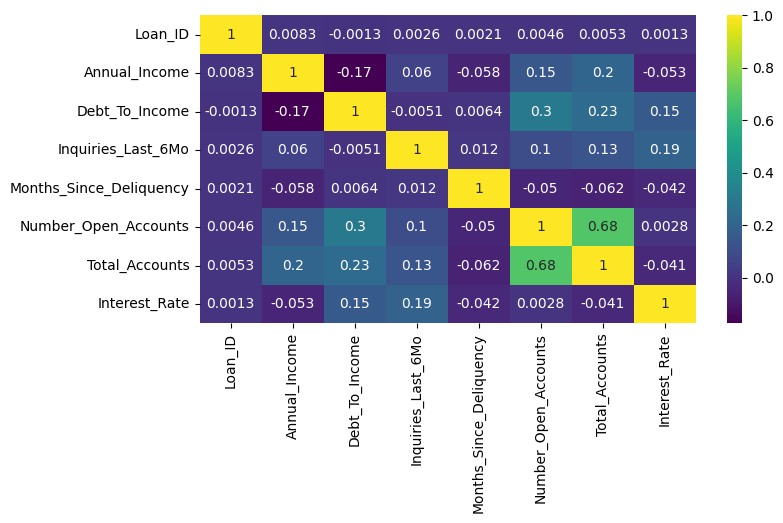

In [ ]:
plt.figure(figsize=(8,4))
sns.heatmap(df.corr(),annot = True, cmap ='viridis')

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Dữ liệu cần được xử lý mising values \
Chọn Interest_Rate làm target vì vậy cần xử lý imbalance

# **Tiền xử lý Dữ liệu (Data Preprocessing)**

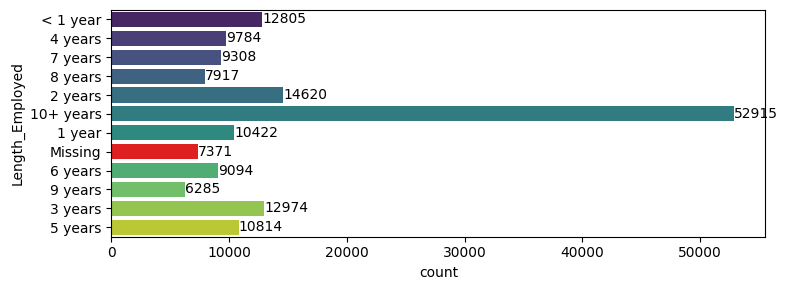

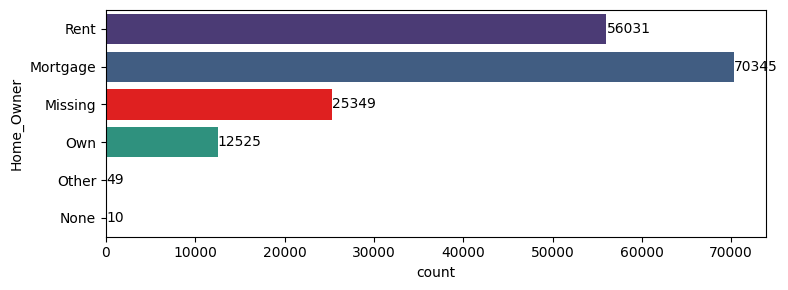

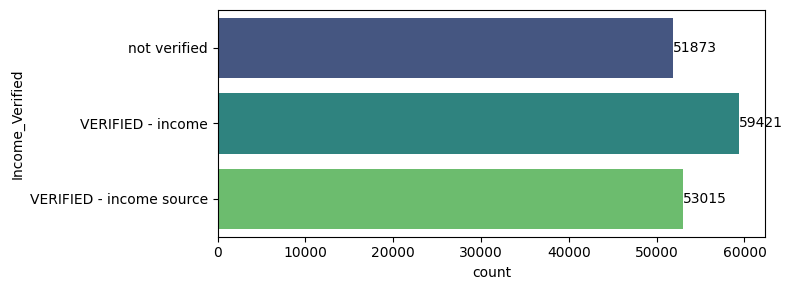

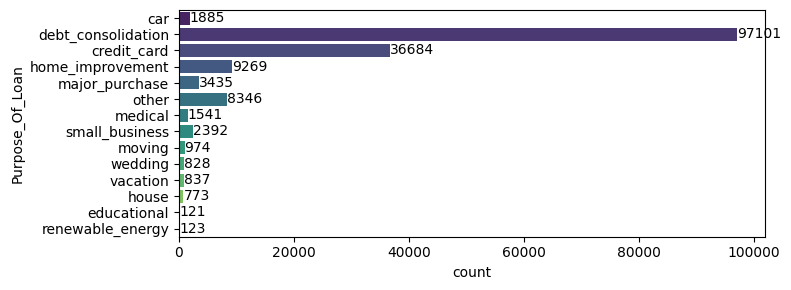

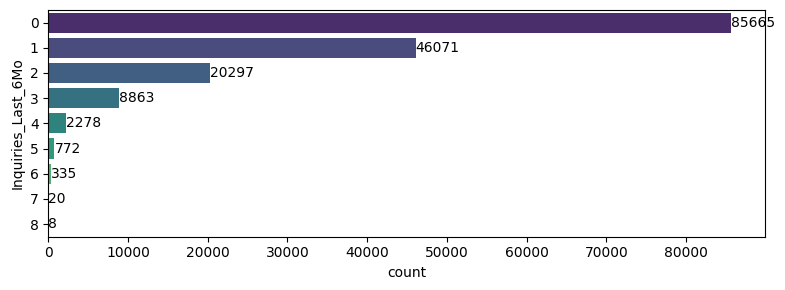

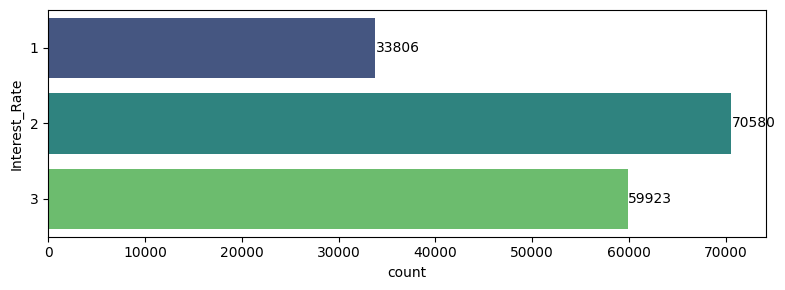

In [ ]:
def plot_countplot(feature_name, df):
    data = df.copy()
    data[feature_name] = data[feature_name].fillna('Missing')

    plt.figure(figsize=(8, 3))

    palette = ['red' if x == 'Missing' else sns.color_palette('viridis', len(data[feature_name].unique()))[i]
               for i, x in enumerate(data[feature_name].unique())]

    sns.countplot(y=feature_name, data=data, palette=palette)
    plt.ylabel(feature_name)

    for p in plt.gca().patches:
        width = p.get_width()
        plt.gca().annotate(f'{int(width)}', (width + 5, p.get_y() + p.get_height() / 2), ha='left', va='center')

    plt.tight_layout()
    plt.show()

col = ['Length_Employed', 'Home_Owner', 'Income_Verified', 'Purpose_Of_Loan', 'Inquiries_Last_6Mo', 'Interest_Rate']
for i in col:
    plot_countplot(i, df)


In [ ]:
max_length = max(len(col) for col in df.columns)
for col in df.columns:
    spaces = " " * (max_length - len(col) + 2)
    print('{}  {}{}'.format(col, spaces, df[col].nunique()))


Loan_ID                    164309
Loan_Amount_Requested      1290
Length_Employed            11
Home_Owner                 5
Annual_Income              12305
Income_Verified            3
Purpose_Of_Loan            14
Debt_To_Income             3953
Inquiries_Last_6Mo         9
Months_Since_Deliquency    122
Number_Open_Accounts       58
Total_Accounts             100
Gender                     2
Interest_Rate              3


In [ ]:
#Chuyển đổi type object thành dữ liệu số
def trans_data(df, columns):
    data = df.copy()
    for col in columns:
        if data[col].dtype == 'object':
            data[col] = data[col].astype('category').cat.codes
    return data

# Sử dụng IterativeImputer để xử lý các giá trị khuyết
def fill_missing_values(df):
    data = df.copy()
    imputer = IterativeImputer(max_iter = 100,random_state = 42)
    imputed_data = imputer.fit_transform(data)
    data_imputed = pd.DataFrame(imputed_data, columns= data.columns)
    data_imputed = data_imputed.clip(lower=0)
    return data_imputed

# định dạng dữ liệu
def format_data(df):
    data = df.copy()
    columns = ['Annual_Income', 'Debt_To_Income']
    for column in data.columns:
        if column in columns:
            data[column] = data[column].astype('float64')
        else:
            data[column] = data[column].astype('int64')
    return data.applymap(lambda x: round(x, 2) if isinstance(x, (int, float)) else x)

# Xử lý dữ liệu
def preprocessing(df):
    data = df.copy()
    # LoanID và Gender có thể không cung cấp thông tin cần thiết => Loại bỏ
    data.drop(['Loan_ID','Gender'], axis = 1, inplace = True)
    # Chuyển kiểu str về kiểu số
    data['Loan_Amount_Requested'] = data['Loan_Amount_Requested'].apply(lambda x: str(x).replace(',', ''))

    #Length_Employed: các giá trị '<1' và '10+' được điều chỉnh thành 0 và 10
    data['Length_Employed'] = data['Length_Employed'].apply(lambda x: str(x).replace('years', '').replace('year', ''))
    data['Length_Employed'] = data['Length_Employed'].replace({'< 1 ': 0, '10+ ': 10})
    data['Length_Employed'][data['Length_Employed'] == 'nan'] = np.nan
    data['Length_Employed'] = data['Length_Employed']
    processed_data = data['Length_Employed'].apply(lambda x: x if pd.isna(x) or isinstance(x, int) else x.strip())
    data['Length_Employed']=  pd.to_numeric(processed_data, errors='coerce')

    #Home_Owner: các giá trị Other và None rất ít => Đặt Other là None
    data['Home_Owner'].replace({'Other': np.nan, 'None': np.nan,'nan': np.nan}, inplace=True)

    cols = ['Home_Owner', 'Income_Verified', 'Purpose_Of_Loan']
    data = trans_data(data, cols)
    data.replace(-1, np.nan, inplace=True)

    data = fill_missing_values(data)
    data =  format_data(data)
    return data

In [ ]:
df1=preprocessing(df)
df1.head()

<ipython-input-8-da352b812df5>:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Length_Employed'][data['Length_Employed'] == 'nan'] = np.nan


,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
0,7000,0,2,68000.00,2,0,18.37,0,38,9,14,1
1,30000,4,0,111522.34,0,2,14.93,0,17,12,24,3
2,24725,7,0,75566.40,1,2,15.88,0,31,12,16,3
3,16000,0,1,56160.00,1,2,14.34,3,35,16,22,3
4,17000,8,1,96000.00,1,2,22.17,1,35,19,30,1


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164309 entries, 0 to 164308
Data columns (total 12 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Loan_Amount_Requested    164309 non-null  int64  
 1   Length_Employed          164309 non-null  int64  
 2   Home_Owner               164309 non-null  int64  
 3   Annual_Income            164309 non-null  float64
 4   Income_Verified          164309 non-null  int64  
 5   Purpose_Of_Loan          164309 non-null  int64  
 6   Debt_To_Income           164309 non-null  float64
 7   Inquiries_Last_6Mo       164309 non-null  int64  
 8   Months_Since_Deliquency  164309 non-null  int64  
 9   Number_Open_Accounts     164309 non-null  int64  
 10  Total_Accounts           164309 non-null  int64  
 11  Interest_Rate            164309 non-null  int64  
dtypes: float64(2), int64(10)
memory usage: 15.0 MB


In [ ]:
df1.isnull().sum()

Loan_Amount_Requested      0
Length_Employed            0
Home_Owner                 0
Annual_Income              0
Income_Verified            0
Purpose_Of_Loan            0
Debt_To_Income             0
Inquiries_Last_6Mo         0
Months_Since_Deliquency    0
Number_Open_Accounts       0
Total_Accounts             0
Interest_Rate              0
dtype: int64

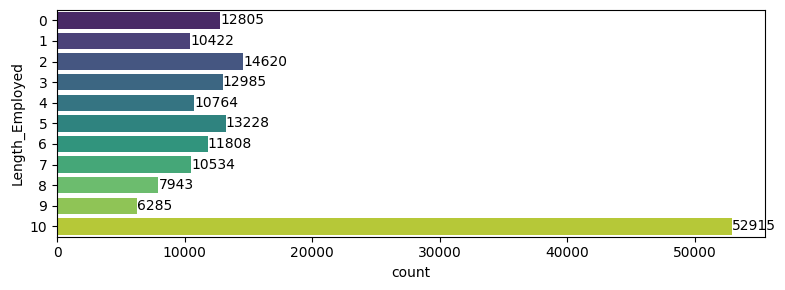

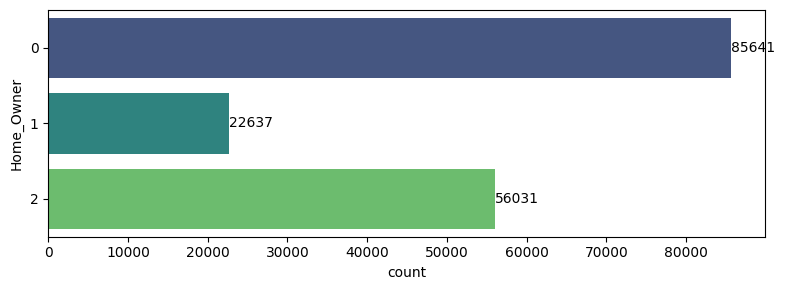

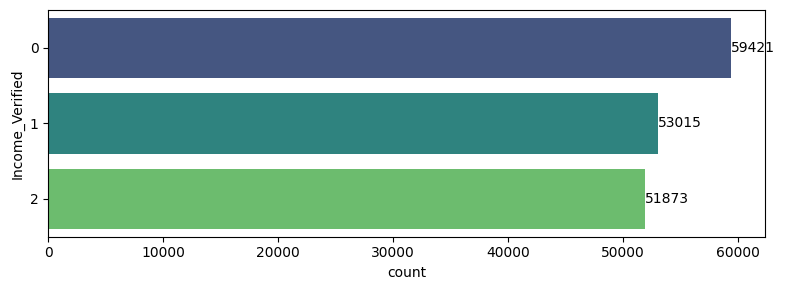

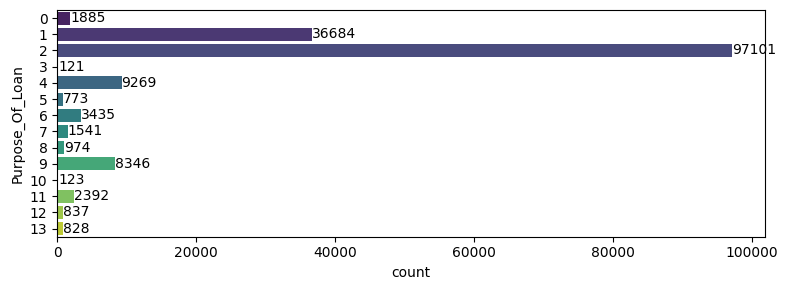

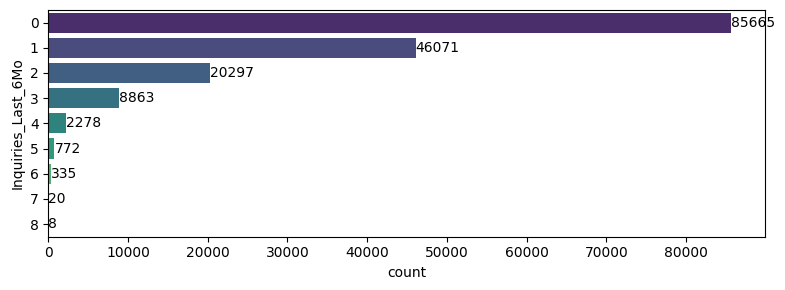

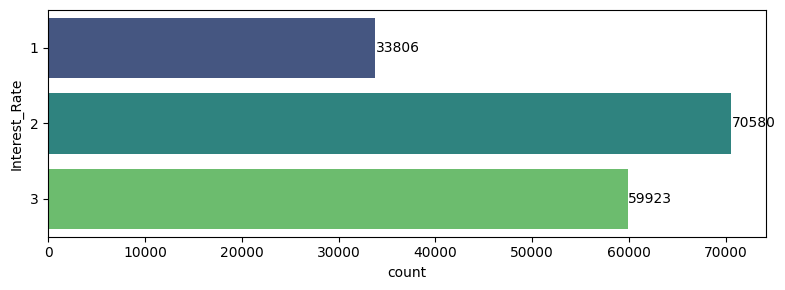

In [ ]:
col = ['Length_Employed', 'Home_Owner', 'Income_Verified', 'Purpose_Of_Loan', 'Inquiries_Last_6Mo', 'Interest_Rate']
for i in col:
    plot_countplot(i, df1)

In [ ]:
df1.describe()

,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
count,164309.00000,164309.000000,164309.000000,1.643090e+05,164309.000000,164309.000000,164309.000000,164309.000000,164309.000000,164309.000000,164309.000000,164309.000000
mean,14349.33692,5.974463,0.819791,7.334718e+04,0.954062,2.646495,17.207189,0.781698,34.455702,11.193818,25.067665,2.158951
std,8281.86870,3.552837,0.910911,5.656733e+04,0.821730,2.395310,7.845083,1.034747,14.907453,4.991813,11.583067,0.738364
min,500.00000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000
25%,8000.00000,3.000000,0.000000,4.600000e+04,0.000000,2.000000,11.370000,0.000000,30.000000,8.000000,17.000000,2.000000
50%,12075.00000,6.000000,0.000000,6.500000e+04,1.000000,2.000000,16.840000,0.000000,35.000000,10.000000,23.000000,2.000000
75%,20000.00000,10.000000,2.000000,8.944567e+04,2.000000,2.000000,22.780000,1.000000,38.000000,14.000000,32.000000,3.000000
max,35000.00000,10.000000,2.000000,7.500000e+06,2.000000,13.000000,39.990000,8.000000,180.000000,76.000000,156.000000,3.000000


In [ ]:
# Annual_Income có min là 0 , điều này cần xác thực
print(df1.Annual_Income.describe())
print('Số lượng Annual_Income có min là 0 : ',(df1['Annual_Income'] == 0).sum())
#=> Xóa các giá trị
df2  = df1.copy()
df2=df2.drop(df1.loc[df1['Annual_Income'] == 0].index.values)
df2.shape

count    1.643090e+05
mean     7.334718e+04
std      5.656733e+04
min      0.000000e+00
25%      4.600000e+04
50%      6.500000e+04
75%      8.944567e+04
max      7.500000e+06
Name: Annual_Income, dtype: float64
Số lượng Annual_Income có min là 0 :  12


(164297, 12)

In [ ]:
df2.describe()

,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
count,164297.000000,164297.000000,164297.000000,1.642970e+05,164297.000000,164297.000000,164297.000000,164297.000000,164297.00000,164297.000000,164297.000000,164297.000000
mean,14350.085516,5.974583,0.819711,7.335254e+04,0.954077,2.646543,17.205854,0.781731,34.45481,11.194100,25.068662,2.158913
std,8281.701230,3.552855,0.910893,5.656593e+04,0.821735,2.395384,7.843781,1.034770,14.90726,4.991869,11.582843,0.738367
min,500.000000,0.000000,0.000000,4.117200e+02,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,2.000000,1.000000
25%,8000.000000,3.000000,0.000000,4.600000e+04,0.000000,2.000000,11.370000,0.000000,30.00000,8.000000,17.000000,2.000000
50%,12075.000000,6.000000,0.000000,6.500000e+04,1.000000,2.000000,16.840000,0.000000,35.00000,10.000000,23.000000,2.000000
75%,20000.000000,10.000000,2.000000,8.945000e+04,2.000000,2.000000,22.780000,1.000000,38.00000,14.000000,32.000000,3.000000
max,35000.000000,10.000000,2.000000,7.500000e+06,2.000000,13.000000,39.990000,8.000000,180.00000,76.000000,156.000000,3.000000


In [ ]:
ProfileReport(df2)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Missing values đã được xử lý

# **Phân tích và Trực quan hóa Dữ liệu (Data Analysis and Visualization)**

<AxesSubplot: >

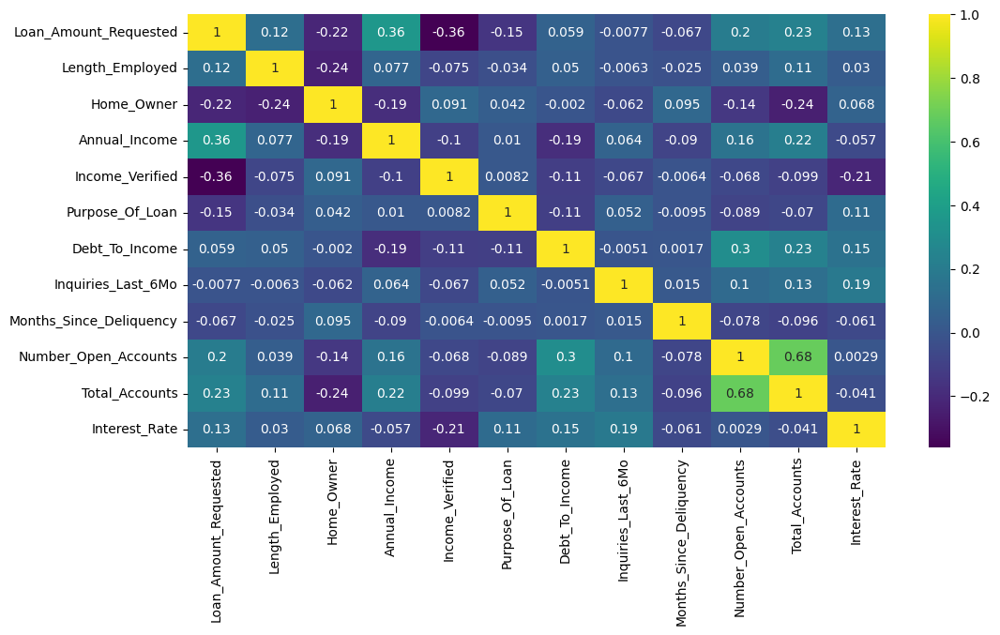

In [ ]:
plt.figure(figsize = [12, 6])
sns.heatmap(df2.corr(), cmap = 'viridis', annot = True)

# Chọn các features quan trọng

In [ ]:
features = df2.drop(columns = 'Interest_Rate')
target = df2['Interest_Rate']

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1056
[LightGBM] [Info] Number of data points in the train set: 164297, number of used features: 11
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

<AxesSubplot: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

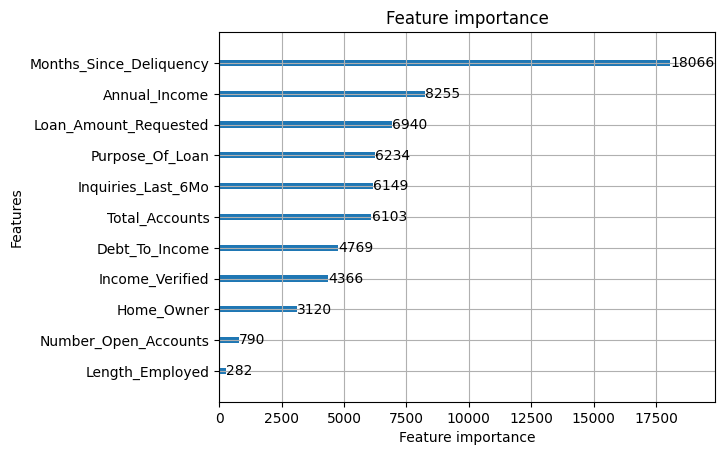

In [ ]:
import lightgbm
param = {'reg_alpha': 1.1, 'num_leaves': 100, 'n_estimators': 700, 'max_depth': 5,
         'learning_rate': 0.001, 'colsample_bytree': 0.7}
lgb = lightgbm.LGBMClassifier(**param, random_state=42, class_weight='balanced',)
lgb.fit(features,target)
lightgbm.plot_importance(lgb)


Loại bỏ 2 features ít tác động nhất là Number_Open_Accounts và Length_Employed

In [ ]:
def imfeatures(data, columns_to_drop):
    df = data.copy()
    df.drop(columns_to_drop, axis=1, inplace=True)
    return df
A = ['Number_Open_Accounts', 'Length_Employed']
df3 = imfeatures(df2, A)


In [ ]:
df3.head()

,Loan_Amount_Requested,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Total_Accounts,Interest_Rate
0,7000,2,68000.00,2,0,18.37,0,38,14,1
1,30000,0,111522.34,0,2,14.93,0,17,24,3
2,24725,0,75566.40,1,2,15.88,0,31,16,3
3,16000,1,56160.00,1,2,14.34,3,35,22,3
4,17000,1,96000.00,1,2,22.17,1,35,30,1


In [ ]:

def plot_features(df, feature_names, plot_type='distplot'):
    num_features = len(feature_names)
    grid_size = (2, 3)
    num_rows = (num_features - 1) // grid_size[1] + 1
    num_cols = min(num_features, grid_size[1])
    plt.figure(figsize=(15, 5 * num_rows))

    for i, col in enumerate(feature_names, 1):
        plt.subplot(num_rows, num_cols, i)
        if plot_type == 'boxplot':
            sns.boxplot(x=col, data=df)
        elif plot_type == 'scatter':
            sns.scatterplot(x=col, y='Target_Column', data=df)  # Chọn 'Target_Column' là cột dữ liệu cần so sánh
        else:
            sns.histplot(df[col], kde=True)  # Kết hợp histogram và đường cong KDE

        plt.title(f"{plot_type.capitalize()} of {col}", fontsize=14)
        plt.xlabel(col, fontsize=12)

    plt.tight_layout()
    plt.show()



In [ ]:
df3.corr().columns

Index(['Loan_Amount_Requested', 'Home_Owner', 'Annual_Income',
       'Income_Verified', 'Purpose_Of_Loan', 'Debt_To_Income',
       'Inquiries_Last_6Mo', 'Months_Since_Deliquency', 'Total_Accounts',
       'Interest_Rate'],
      dtype='object')

In [ ]:
COL = df.corr().columns
COL = COL.drop(['Loan_ID','Interest_Rate','Number_Open_Accounts','Inquiries_Last_6Mo'])
COL

Index(['Annual_Income', 'Debt_To_Income', 'Months_Since_Deliquency',
       'Total_Accounts'],
      dtype='object')

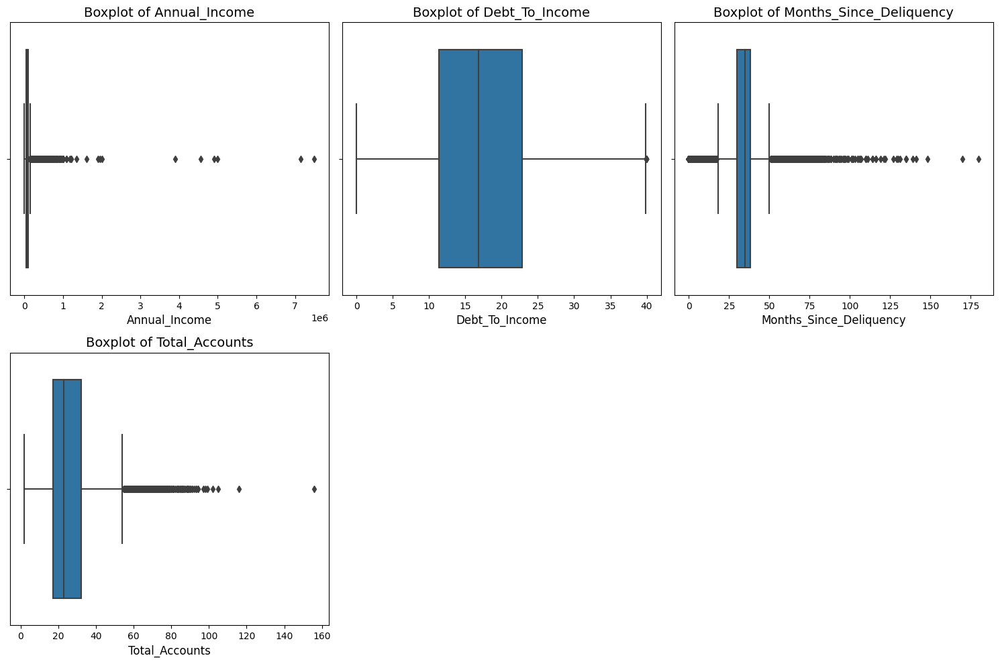

In [ ]:
plot_features(df3, COL, plot_type='boxplot')

Annual_Income,Months_Since_Deliquency,Total_Accounts\
Nhận thấy 3 features này có lượng outliers lớn

# Xử lý outliers

Cách 1: z_scores

In [ ]:
# Tạo danh sách
out_series = ['Annual_Income','Months_Since_Deliquency','Total_Accounts']

In [ ]:
# Xác định khoảng Outliers
def find_outliers(df, feature_names):
    data = df.copy()
    for feature_name in feature_names:
        z_scores = np.abs(stats.zscore(data[feature_name]))
        threshold = 3
        data = data[(z_scores < threshold)]
    return data
# Xóa các giá trị Outliers đã được xác định
def remove_outliers(df, feature_names):
    data = df.copy()
    data = find_outliers(data, feature_names)
    return data


In [ ]:
df4= remove_outliers(df3, out_series)
df4.head()

,Loan_Amount_Requested,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Total_Accounts,Interest_Rate
0,7000,2,68000.00,2,0,18.37,0,38,14,1
1,30000,0,111522.34,0,2,14.93,0,17,24,3
2,24725,0,75566.40,1,2,15.88,0,31,16,3
3,16000,1,56160.00,1,2,14.34,3,35,22,3
4,17000,1,96000.00,1,2,22.17,1,35,30,1


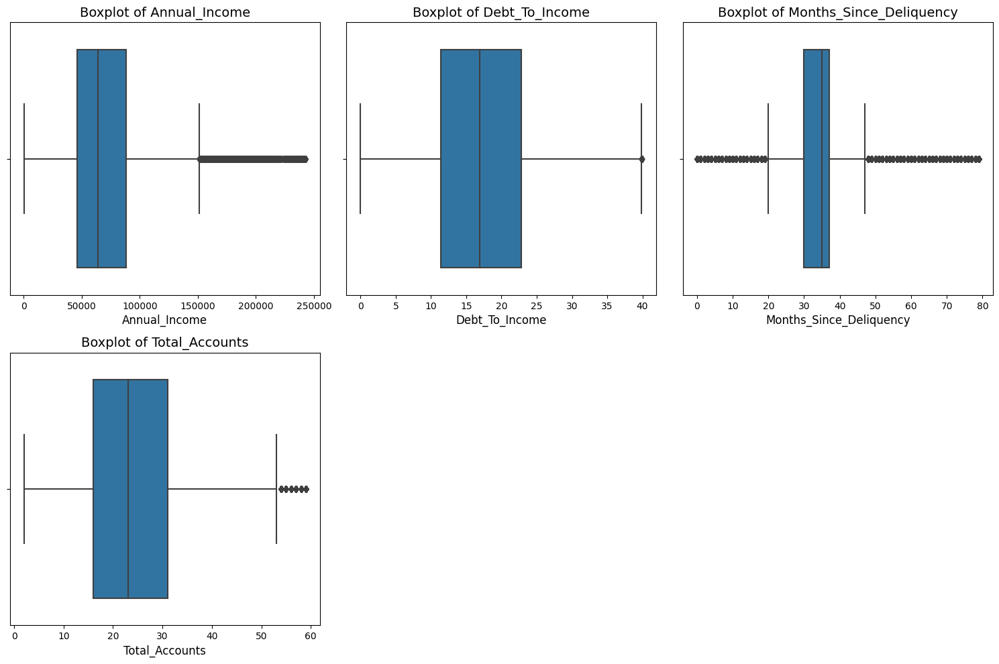

In [ ]:
plot_features(df4, COL, plot_type='boxplot')

Cách 2: IsolationForest

In [ ]:
import pandas as pd
from sklearn.ensemble import IsolationForest

def Iso_handle(data):
    df = data.copy()

    # Handling NaN values
    df.dropna(inplace=True)

    X = df.drop(columns='Interest_Rate').values
    y = df['Interest_Rate'].values

    model = IsolationForest(n_estimators=300, max_samples='auto', contamination=0.1, max_features=1.0)
    model.fit(X)
    outliers = model.predict(X)

    print(sum(outliers < 0))  # Outliers

    X_filtered = X[outliers > 0]
    y_filtered = y[outliers > 0]

    new_df = pd.DataFrame(X_filtered, columns=df.drop(columns='Interest_Rate').columns)
    new_df['Interest_Rate'] = y_filtered

    return new_df


In [ ]:
df5 = Iso_handle(df3)
df5.head()

16430


,Loan_Amount_Requested,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Total_Accounts,Interest_Rate
0,7000.0,2.0,68000.00,2.0,0.0,18.37,0.0,38.0,14.0,1
1,30000.0,0.0,111522.34,0.0,2.0,14.93,0.0,17.0,24.0,3
2,24725.0,0.0,75566.40,1.0,2.0,15.88,0.0,31.0,16.0,3
3,16000.0,1.0,56160.00,1.0,2.0,14.34,3.0,35.0,22.0,3
4,17000.0,1.0,96000.00,1.0,2.0,22.17,1.0,35.0,30.0,1


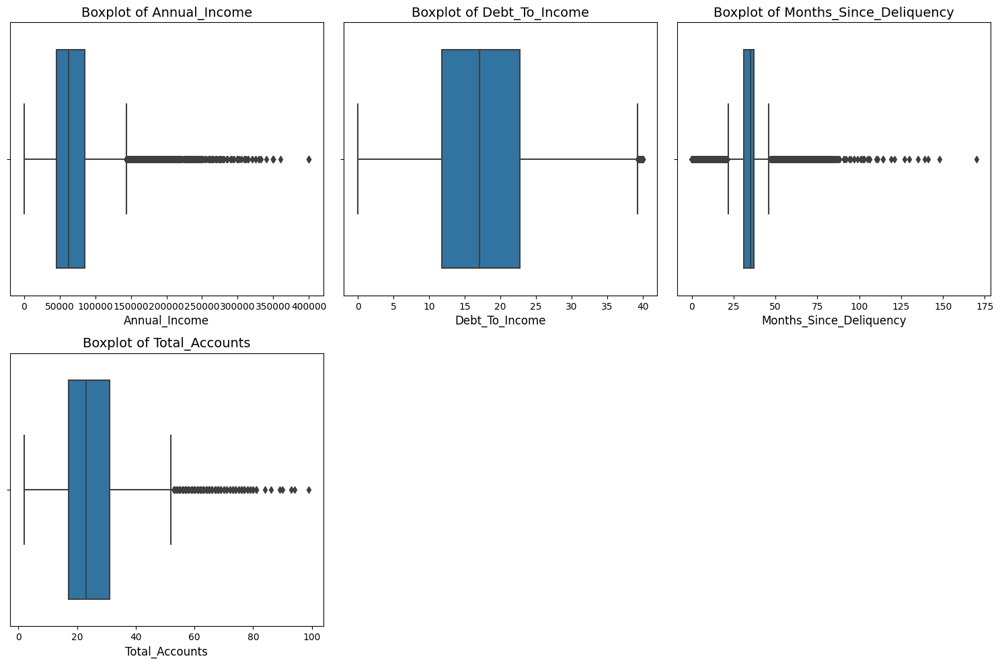

In [ ]:
plot_features(df5, COL, plot_type='boxplot')

In [ ]:
print('Z_Scores        : ',df4.shape[0])
print('Isolation Forest: ',df5.shape[0])

Z_Scores        :  160251
Isolation Forest:  147867


1. Nhận thấy khi áp dụng z_scores thông tin được giữ lại nhiều hơn(12384) so với Isolation Forest \
2. Trực quan bằng boxplot, nhận thấy các điểm outliers vẫn chauw được xử lý ổn thỏa

Kiểm tra tính phân phối

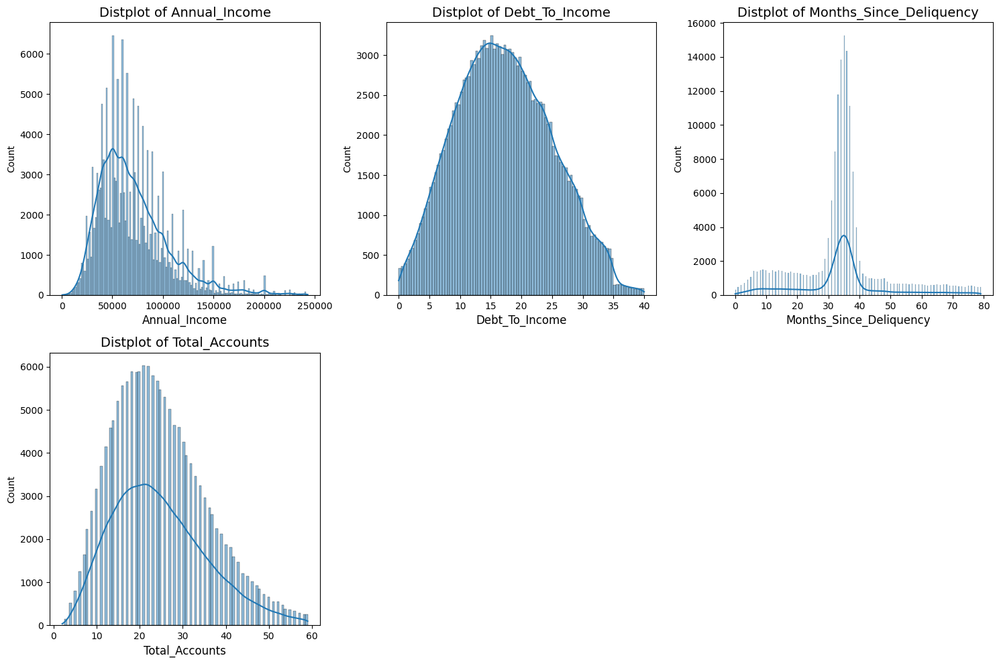

In [ ]:
plot_features(df4, COL, plot_type='distplot')

Nhận thấy dữ liệu có xu hướng lệch trái

# **Xây dựng Mô hình (Model Building)**

In [ ]:
def split_data(data):
    df = data.copy()
    X = df.drop(columns = 'Interest_Rate').values
    y = df['Interest_Rate'].values
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2023)
    # Chuẩn hóa dữ liệu trên tập train và test
    scaler= RobustScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Áp dụng Box-Cox Transform
    transformer = PowerTransformer()
    X_train_transformer =  transformer.fit_transform(X_train_scaled)  # Áp dụng log và tránh log(0)
    X_test_transformer = transformer.transform(X_test_scaled)
    X_train_transformer_df = pd.DataFrame(X_train_transformer, columns=df.drop(columns='Interest_Rate').columns)
    X_test_transformer_df = pd.DataFrame(X_test_transformer, columns=df.drop(columns='Interest_Rate').columns)
    y_train_df = pd.Series(y_train, name='Interest_Rate')
    y_test_df = pd.Series(y_test, name='Interest_Rate')
    return X_train_transformer_df,X_test_transformer_df, y_train_df, y_test_df


RobustScaler phù hợp với dữ liệu có giá trị outliers. \
Box-Cox Transform để dữ liệu về phân phối chuẩn, gần chuẩn.

In [ ]:
X_train, X_test, y_train, y_test = split_data(df4)

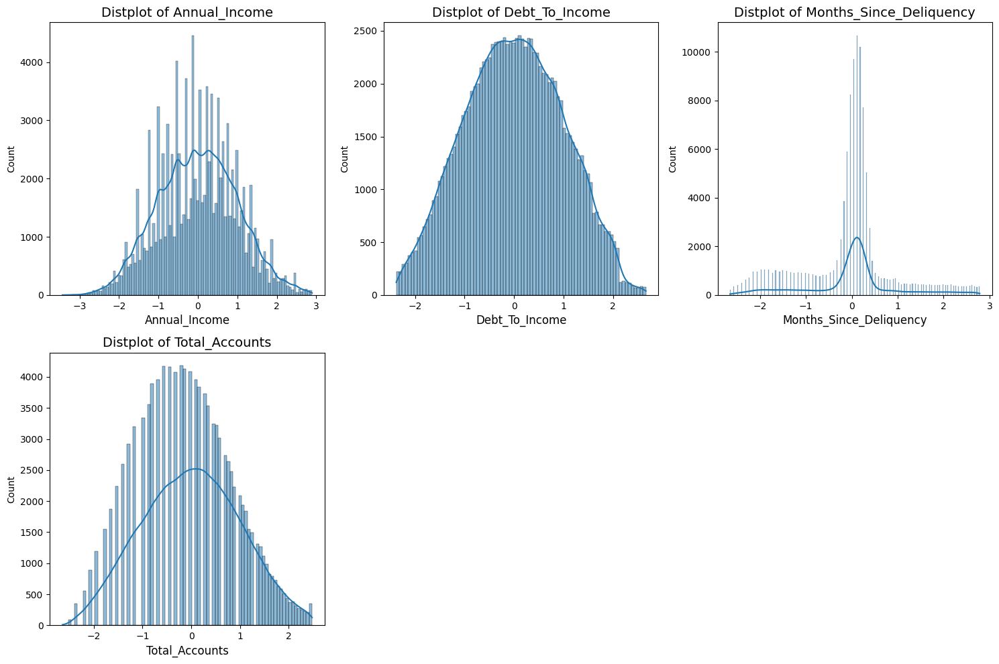

In [ ]:
plot_features(X_train, COL, plot_type='distplot')

    Dữ liệu gần phân phối chuẩn

Kiểm tra tình trạng Imbalance trong target

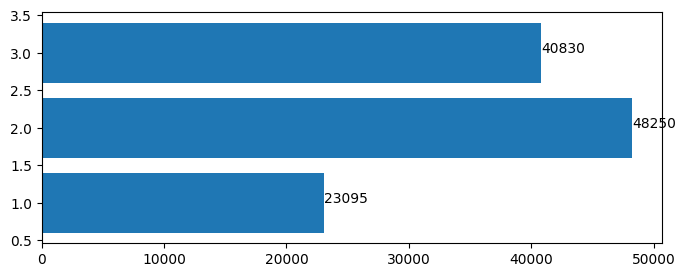

In [ ]:
Co = Counter(y_train)
plt.figure(figsize=(8, 3))
plt.barh(list(Co.keys()), list(Co.values()))
for key, value in Co.items():
    plt.text(value, key, str(value))
plt.show()

Các giá trị trong tập target Interest Rate cần được xử lý mất cân bằng

In [ ]:
#ma trận đánh giá mô hình
def evaluate_model(y_true, y_pred):
    report = classification_report(y_true, y_pred)
    print("Classification Report\n",report)
    cm = confusion_matrix(y_true,y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.show()

# Xây dựng các mô hình Machine Learning
def Build_Model(X_train,X_test, y_train, y_test,model):
    # XXử lý imabalance với SMOTE Oversampling
    pipeline = make_imb_pipeline(
        SMOTE(),
        model
    )

    # Huấn luyện pipeline trên dữ liệu huấn luyện
    model = pipeline.fit(X_train, y_train)
    # Sử dụng mô hình để dự đoán kết quả trên tập kiểm tra
    y_pred = model.predict(X_test)
    # Sử dụng mô hình để dự đoán kết quả trên tập huấn luyện
    y_train_pred = model.predict(X_train)

    # Đánh giá mô hình trên tập kiểm tra
    print("Evaluation on the test set:")
    evaluate_model(y_test, y_pred)
    # Đánh giá mô hình trên tập huấn luyện
    print("Evaluation on the training set:")
    evaluate_model(y_train, y_train_pred)



# **LogisticRegression**

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.35      0.61      0.45      9832
           2       0.52      0.26      0.35     20686
           3       0.54      0.63      0.58     17558

    accuracy                           0.47     48076
   macro avg       0.47      0.50      0.46     48076
weighted avg       0.49      0.47      0.45     48076



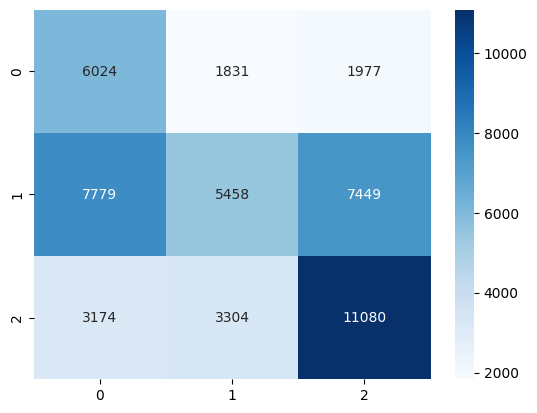

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.35      0.60      0.45     23095
           2       0.51      0.26      0.35     48250
           3       0.54      0.64      0.58     40830

    accuracy                           0.47    112175
   macro avg       0.47      0.50      0.46    112175
weighted avg       0.49      0.47      0.45    112175



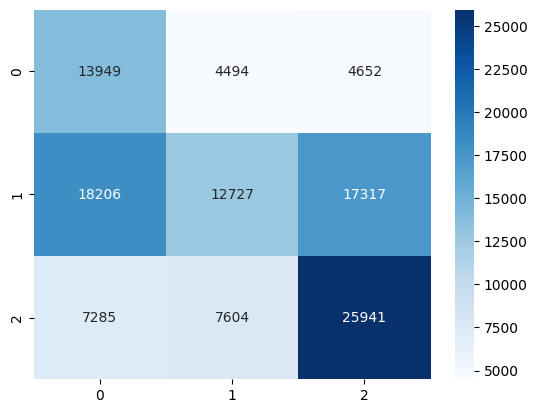

In [ ]:
Build_Model(X_train,X_test, y_train, y_test,model = LogisticRegression(class_weight="balanced"))

Mất cân bằng và underfiting đối với Logistic

# **NaiveBayes**

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.41      0.47      0.44      9832
           2       0.49      0.54      0.52     20686
           3       0.58      0.47      0.52     17558

    accuracy                           0.50     48076
   macro avg       0.50      0.49      0.49     48076
weighted avg       0.51      0.50      0.50     48076



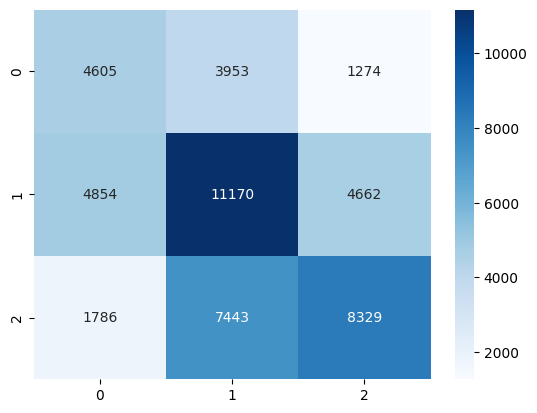

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.40      0.45      0.43     23095
           2       0.49      0.54      0.51     48250
           3       0.57      0.47      0.52     40830

    accuracy                           0.49    112175
   macro avg       0.49      0.49      0.48    112175
weighted avg       0.50      0.49      0.50    112175



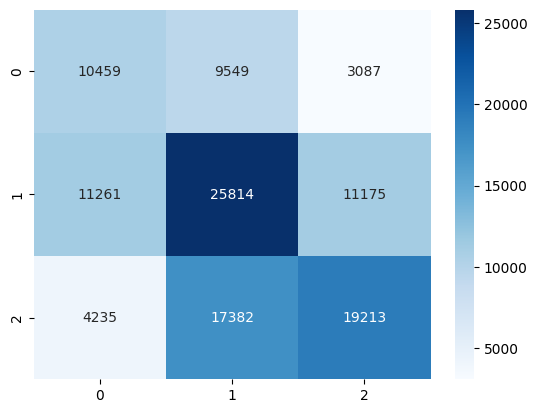

In [ ]:
Build_Model(X_train,X_test, y_train, y_test,model =  GaussianNB(priors=[0.3, 0.4, 0.3], var_smoothing=1e-8))

GaussianNB xử lý imbalance tốt hơn nhưng còn tình trạng underfiting

# **DecisionTree**

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.39      0.65      0.49      9832
           2       0.51      0.26      0.35     20686
           3       0.56      0.66      0.61     17558

    accuracy                           0.49     48076
   macro avg       0.48      0.53      0.48     48076
weighted avg       0.50      0.49      0.47     48076



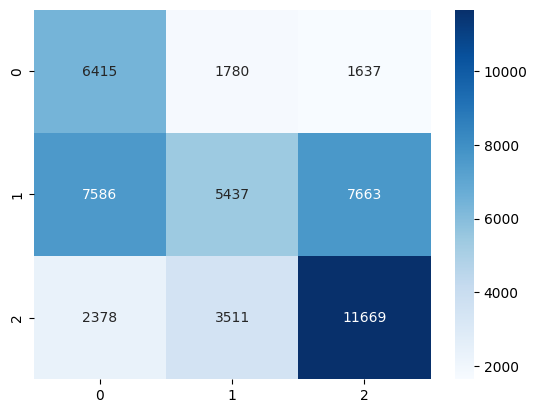

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.39      0.65      0.49     23095
           2       0.50      0.26      0.34     48250
           3       0.56      0.67      0.61     40830

    accuracy                           0.49    112175
   macro avg       0.48      0.53      0.48    112175
weighted avg       0.50      0.49      0.47    112175



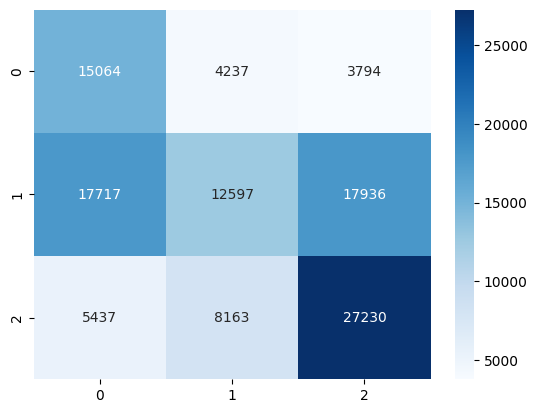

In [ ]:
Build_Model(X_train,X_test, y_train, y_test,model = DecisionTreeClassifier(max_depth=5, min_samples_split=5, random_state=42))

Imbalance và Underfiting cần còn. Tốt hơn Logistic và tệ hơn GaussianNB

# **RandomForest**

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.52      0.74      0.61      9832
           2       0.66      0.41      0.50     20686
           3       0.63      0.76      0.69     17558

    accuracy                           0.60     48076
   macro avg       0.60      0.64      0.60     48076
weighted avg       0.62      0.60      0.59     48076



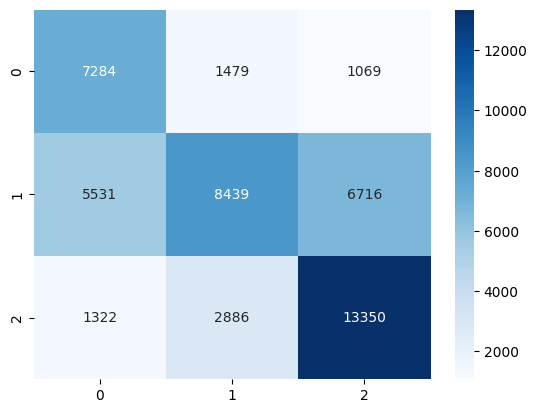

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.52      0.75      0.62     23095
           2       0.67      0.42      0.51     48250
           3       0.64      0.77      0.70     40830

    accuracy                           0.61    112175
   macro avg       0.61      0.64      0.61    112175
weighted avg       0.63      0.61      0.60    112175



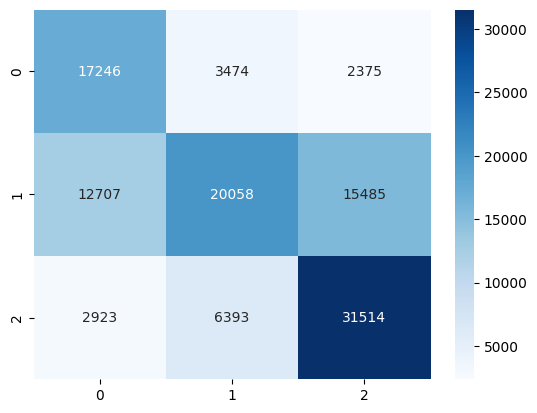

In [ ]:
Build_Model(X_train,X_test, y_train, y_test,model =  RandomForestClassifier(n_estimators=200, max_depth=8, verbose=False))

Tuy accuracy tăng 10% so với các mô hình trước, nhưng imbalance ở class 2 tệ và underfiting

# **CatBoost**

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.71      0.74      0.72      9832
           2       0.75      0.70      0.72     20686
           3       0.75      0.78      0.76     17558

    accuracy                           0.74     48076
   macro avg       0.73      0.74      0.74     48076
weighted avg       0.74      0.74      0.74     48076



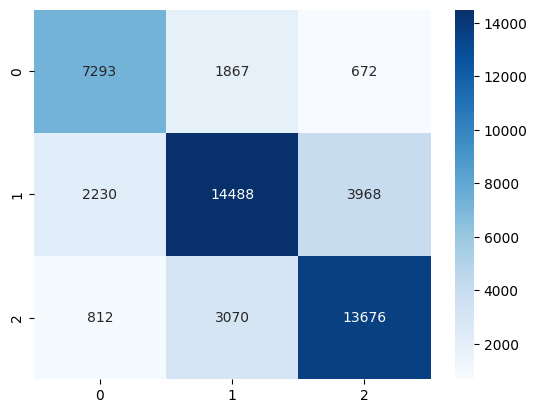

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.71      0.75      0.73     23095
           2       0.76      0.71      0.73     48250
           3       0.76      0.79      0.77     40830

    accuracy                           0.75    112175
   macro avg       0.74      0.75      0.74    112175
weighted avg       0.75      0.75      0.75    112175



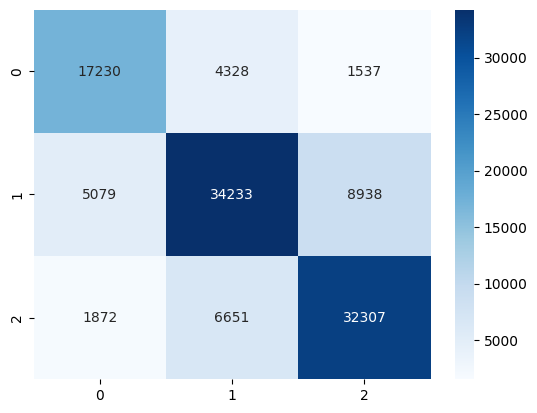

In [ ]:
Build_Model(X_train,X_test, y_train, y_test,model = CatBoostClassifier(iterations=200, depth=8, learning_rate=0.1, verbose=False))

CatBoost thực hiện tốt với accuracy 75% \
Vấn đề imbalance vào khoảng 70%, phù hợp với accuracy,  precision, f1-score

# **XGBoost**

[22:36:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "depth", "iterations", "verbose" } are not used.

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           0       0.67      0.72      0.69      9832
           1       0.73      0.67      0.70     20686
           2       0.73      0.77      0.75     17558

    accuracy                           0.72     48076
   macro avg       0.71      0.72      0.71     48076
weighted avg       0.72      0.72      0.72     48076



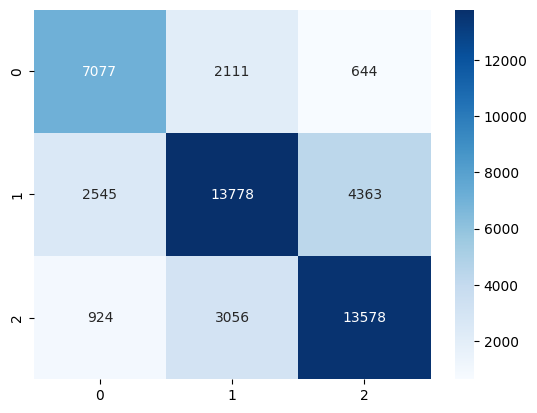

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           0       0.68      0.73      0.71     23095
           1       0.75      0.68      0.71     48250
           2       0.74      0.79      0.77     40830

    accuracy                           0.73    112175
   macro avg       0.73      0.74      0.73    112175
weighted avg       0.73      0.73      0.73    112175



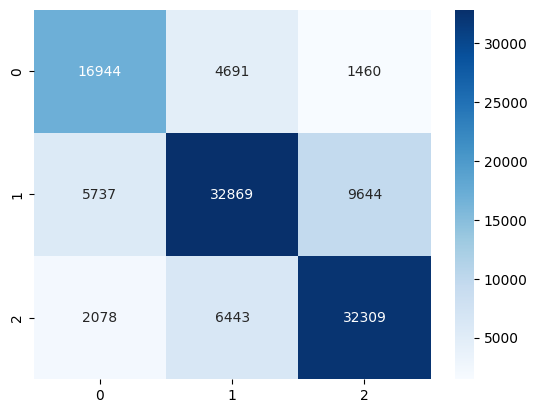

In [ ]:
from xgboost import XGBClassifier
y_train_XGB = y_train - 1
y_test_XGB = y_test - 1
Build_Model(X_train,X_test, y_train_XGB, y_test_XGB,model = XGBClassifier(iterations=200, depth=8, learning_rate=0.1, verbose=False))

Kết quả tuy không bằng CatBoost nhưng chi phí thực hiện tốt hơn đôi chút

# **MLP**

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.67      0.80      0.73      9832
           2       0.79      0.67      0.72     20686
           3       0.75      0.80      0.77     17558

    accuracy                           0.74     48076
   macro avg       0.73      0.76      0.74     48076
weighted avg       0.75      0.74      0.74     48076



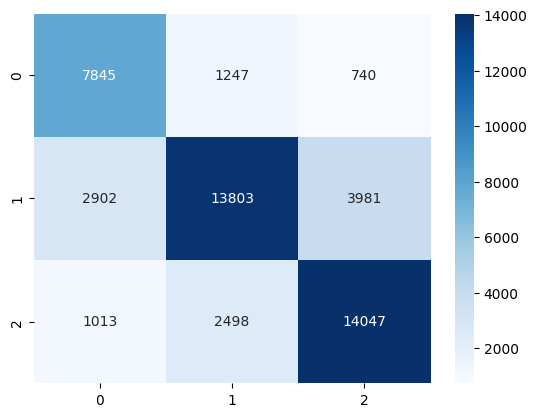

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.66      0.80      0.72     23095
           2       0.78      0.66      0.72     48250
           3       0.75      0.80      0.77     40830

    accuracy                           0.74    112175
   macro avg       0.73      0.75      0.74    112175
weighted avg       0.75      0.74      0.74    112175



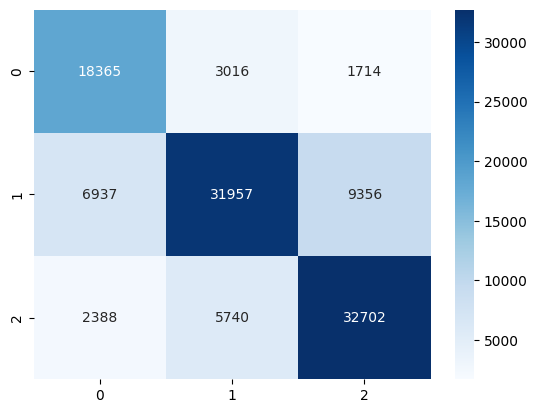

In [ ]:
Build_Model(X_train,X_test, y_train, y_test,model =  MLPClassifier(hidden_layer_sizes= (10, 100) ,activation = 'logistic', batch_size = 200, learning_rate = 'adaptive'))

Imbalance vẫn xảy ra, kết quả thấp hơn so với XGBoost \
Thời gian chạy lâu

# Thử nghiệm với Dataset khi không phụ thuộc vào lightgbm

In [ ]:
df_2= remove_outliers(df2, out_series)
df_2.head()

,Loan_Amount_Requested,Length_Employed,Home_Owner,Annual_Income,Income_Verified,Purpose_Of_Loan,Debt_To_Income,Inquiries_Last_6Mo,Months_Since_Deliquency,Number_Open_Accounts,Total_Accounts,Interest_Rate
0,7000,0,2,68000.00,2,0,18.37,0,38,9,14,1
1,30000,4,0,111522.34,0,2,14.93,0,17,12,24,3
2,24725,7,0,75566.40,1,2,15.88,0,31,12,16,3
3,16000,0,1,56160.00,1,2,14.34,3,35,16,22,3
4,17000,8,1,96000.00,1,2,22.17,1,35,19,30,1


In [ ]:
df_2.shape

(160251, 12)

In [ ]:
X_train_2, X_test_2, y_train_2, y_test_2 = split_data(df_2)

Chạy các mô hình trước đó

# Logistic

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.36      0.61      0.45      9832
           2       0.51      0.27      0.35     20686
           3       0.54      0.63      0.58     17558

    accuracy                           0.47     48076
   macro avg       0.47      0.50      0.46     48076
weighted avg       0.49      0.47      0.46     48076



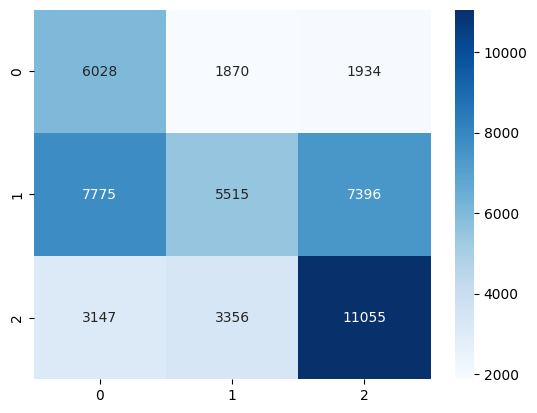

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.36      0.60      0.45     23095
           2       0.51      0.27      0.35     48250
           3       0.54      0.64      0.59     40830

    accuracy                           0.47    112175
   macro avg       0.47      0.50      0.46    112175
weighted avg       0.49      0.47      0.46    112175



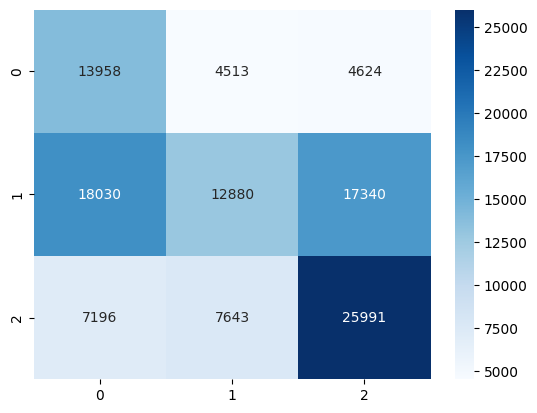

In [ ]:
#Logistic
Build_Model(X_train_2,X_test_2, y_train_2, y_test_2,model = LogisticRegression(class_weight="balanced"))

Logistic không thay đổi nhiều

# **NaiveBayes**

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.41      0.47      0.44      9832
           2       0.49      0.53      0.51     20686
           3       0.58      0.48      0.52     17558

    accuracy                           0.50     48076
   macro avg       0.49      0.49      0.49     48076
weighted avg       0.51      0.50      0.50     48076



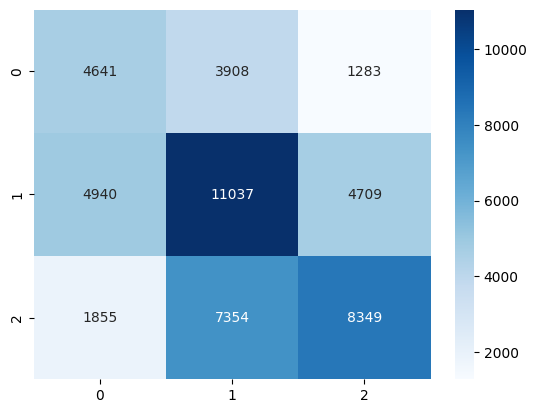

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.40      0.46      0.43     23095
           2       0.49      0.53      0.51     48250
           3       0.57      0.47      0.52     40830

    accuracy                           0.49    112175
   macro avg       0.49      0.49      0.49    112175
weighted avg       0.50      0.49      0.50    112175



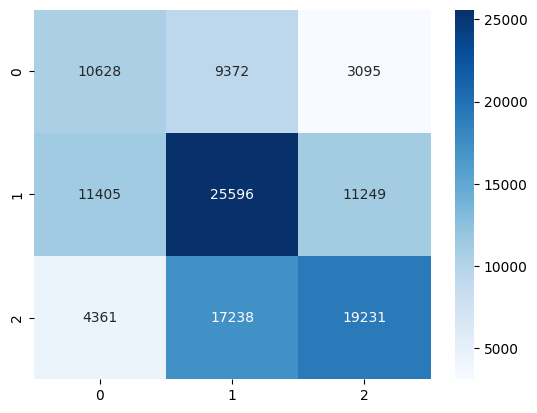

In [ ]:
Build_Model(X_train_2,X_test_2, y_train_2, y_test_2,model =  GaussianNB(priors=[0.3, 0.4, 0.3], var_smoothing=1e-8))

trong NaiveBayes : recall có vẻ thấp hơn lúc trước và accuracy tập train bé hơn tập test

Có thể đoán rằng Desicion Tree không hợp cải thiện các giá trị với bộ dữ liệu này

# XGBoost

[23:15:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "depth", "iterations", "verbose" } are not used.

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           0       0.71      0.69      0.70      9832
           1       0.71      0.70      0.70     20686
           2       0.74      0.76      0.75     17558

    accuracy                           0.72     48076
   macro avg       0.72      0.71      0.72     48076
weighted avg       0.72      0.72      0.72     48076



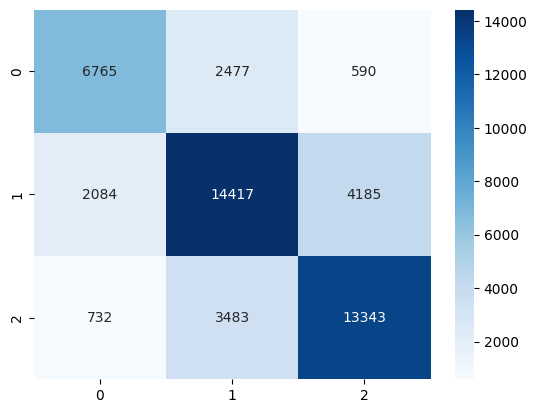

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           0       0.72      0.70      0.71     23095
           1       0.73      0.71      0.72     48250
           2       0.75      0.78      0.77     40830

    accuracy                           0.74    112175
   macro avg       0.73      0.73      0.73    112175
weighted avg       0.74      0.74      0.74    112175



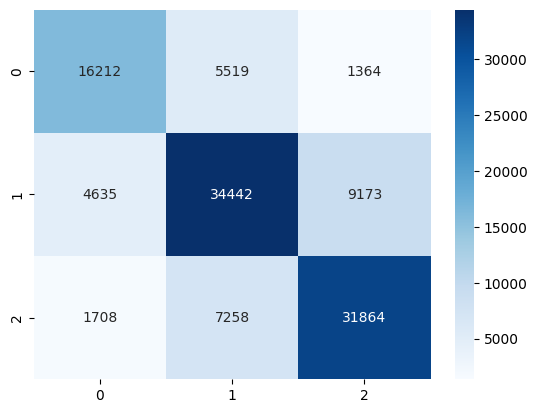

In [ ]:

y_train_XGB_2 = y_train_2 - 1
y_test_XGB_2 = y_test_2 - 1
Build_Model(X_train_2,X_test_2, y_train_XGB_2, y_test_XGB_2,model = XGBClassifier(iterations=200, depth=8, learning_rate=0.1, verbose=False))

Tốt hơn lúc trước

# MLP

Evaluation on the test set:
Classification Report
               precision    recall  f1-score   support

           1       0.74      0.77      0.76      9832
           2       0.77      0.74      0.75     20686
           3       0.77      0.79      0.78     17558

    accuracy                           0.76     48076
   macro avg       0.76      0.77      0.76     48076
weighted avg       0.76      0.76      0.76     48076



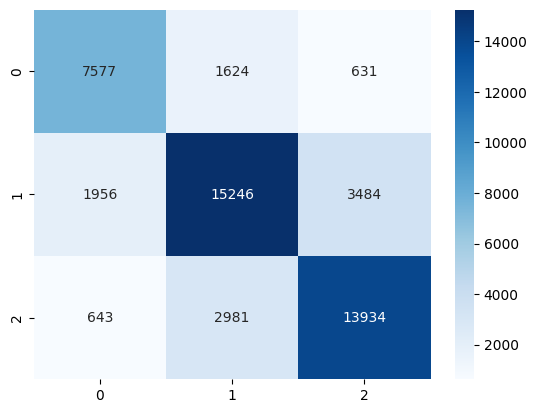

Evaluation on the training set:
Classification Report
               precision    recall  f1-score   support

           1       0.74      0.77      0.75     23095
           2       0.77      0.73      0.75     48250
           3       0.77      0.79      0.78     40830

    accuracy                           0.76    112175
   macro avg       0.76      0.76      0.76    112175
weighted avg       0.76      0.76      0.76    112175



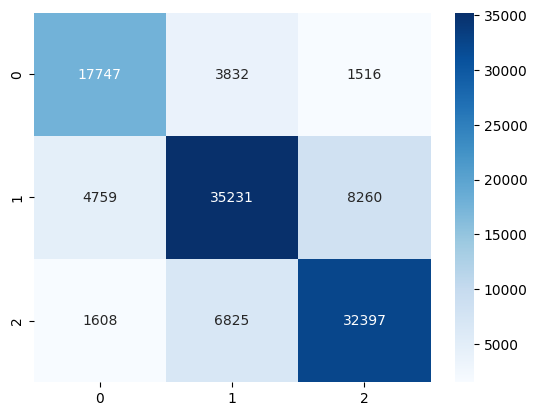

In [ ]:
Build_Model(X_train_2,X_test_2, y_train_2, y_test_2,model =  MLPClassifier(hidden_layer_sizes= (10, 100) ,activation = 'logistic', batch_size = 200, learning_rate = 'adaptive'))

MLP thực hiện tốt hơn trước, imbalance cũng xử lý tốt hơn

Giữ lại các features cung cấp thêm thông tin. Điều này làm cải thiện recall và accuracy cho các mô hình

# Đánh giá
# I. Xử lý dữ liệu. \
1. Xử lý dữ liệu sai định dạng: \
Xử lý các giá trị như 'years','None',... để chuyển đổi thành NaN. \
Xử lý kiểu dữ liệu 'str,object' về định dạng kiểu số là int, float. \
Các giá trị -1 xuất hiện trong quá trình chuyển đổi các dữ liệu rời rạc về dạng kiểu int. Thay đổi các giá trị -1 này thành NaN. \
2. Xử lý dữ liệu bị rỗng. \
Xử lý NaN với kỹ thuật ước lượng bằng mô hình IterativeImputer. \
3. Chọn các features
    Áp dụng lightgbm để tìm các features quan trọng
4. Loại bỏ các giá trị outliers. \
    Phương pháp z_score nhằm loại bỏ các giá trị liên tục. \
    Phương pháp IsolationForest
5. Xử lý phân phối.\
Các features có giá trị liên tục có phân phối lệch trái. \
Cần xử lý để các giá trị đạt gần phân phối chuẩn nhất bằng phương pháp boxcox transform.

# II. Đánh giá mô hình
1. Xử dụng Smote để xử lý vẫn đề imbalance các lớp trong target Interest_Rate. \
Thông qua recall, Vấn đề imbalance đã được cải thiện tốt. \

2. Các mô hình như RandomForest, Logistic, DecisionTree, NaiveBayes đều Underfiting với accuracy thấp mức 50%. Tình trạng imbalance cao mặc dù đã dùng SMOTE. Trong đó NaiveBayes tuy đạt giá trị thấp nhưng các giá trị trong recall đề gần bằng nhau. Điều này cho thấy NaiveBayes xử lý tương đối tốt khi dữ liệu imbalance.

# III. Kết luận
1. Quá trình xử lý dữ liệu đã hạn chế mất mát thông tin nhất có thể. \
2. Xử lý bộ dữ liệu đạt phân phối gần đạt chuẩn
3. Chưa thử nghiệm đánh giá và so sánh các kỹ thuật như PCA, Polynomial transform, Grid SearchCV, ...\
Đối với mô hình SVM, chi phí thực hiện lớn nên chưa có kết quả thử nghiệm.